In [1]:
import numpy as np
import sys
sys.path.append('/Users/tarkhov/GitHub/DGPE/')
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from scipy.integrate import odeint
%matplotlib inline

/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  0.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


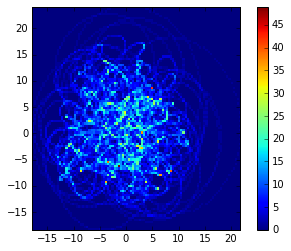

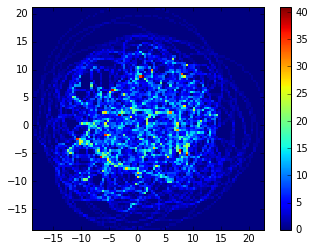

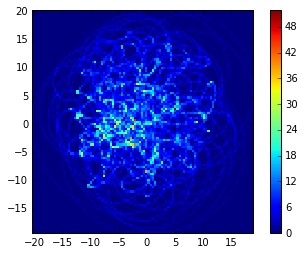

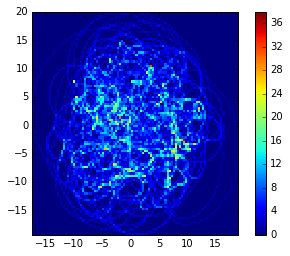

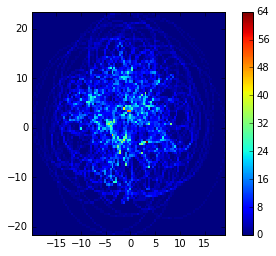

...

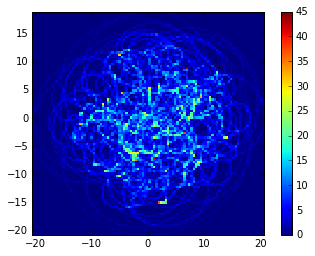

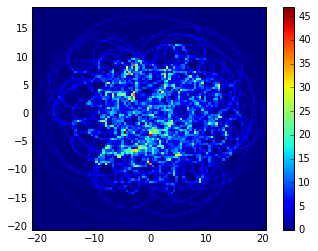

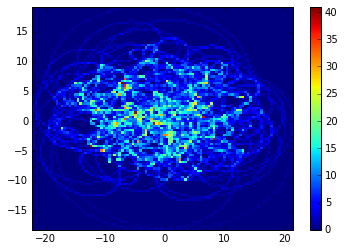

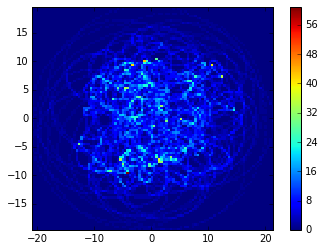

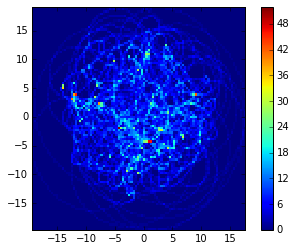

[0.34336759758749907, 0.37066894247310261, 0.38568112971838309, 0.26647258200903989, 0.36550439375305965, 0.36928977624287257, 0.40216885038637656, 0.2920246987306897, 0.32446904525337306]
[0.33031506585019249, 0.38173015187941789, 0.39407723123271027, 0.29794582542915427, 0.37871069954847603, 0.37743646475314396, 0.42035010213894214, 0.29315902361908008, 0.29693793976721095]
Error code:  


Checksum:  0


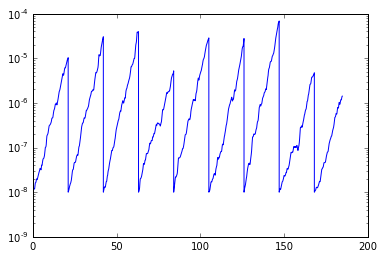

In [4]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 0.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(5,3), dimensionality=2,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)


/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  10.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


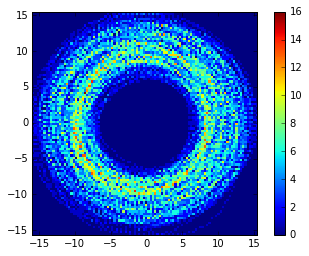

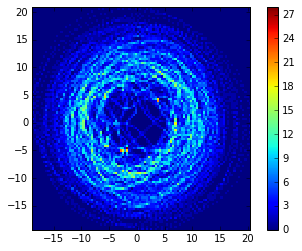

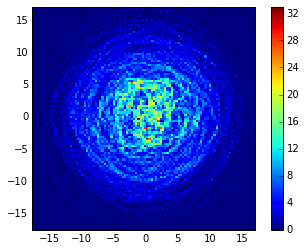

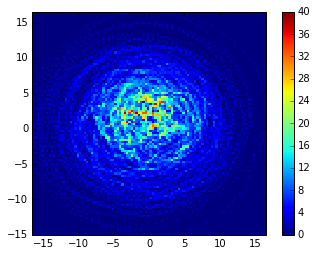

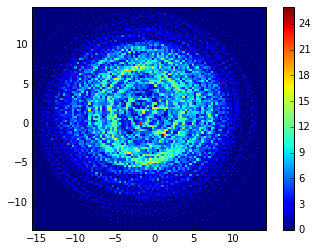

...

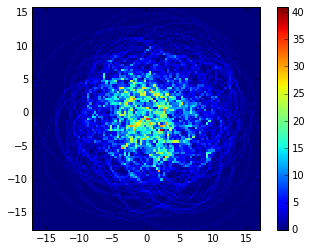

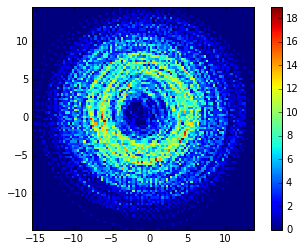

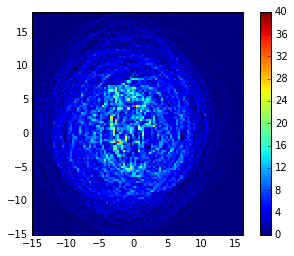

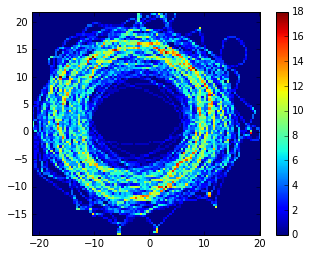

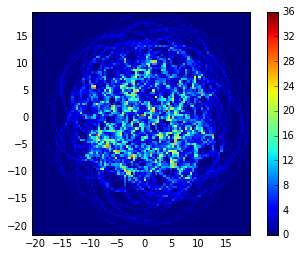

[0.24355980421898243, 0.21782966691759306, 0.25841634657387935, 0.22273547523779549, 0.20016298290929821, 0.20683242660149831, 0.20451887901289628, 0.20200105509975075, 0.26109743795697926]
[0.26078270348328531, 0.22553779803312257, 0.26589541495558344, 0.20478882536633644, 0.21837219434360644, 0.22098290867443149, 0.2069895185639086, 0.21846933482776135, 0.29187594894529539]
Error code:  


Checksum:  0


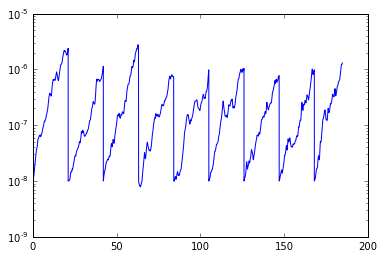

In [5]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 10.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(5,3), dimensionality=2,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)



/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  4.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


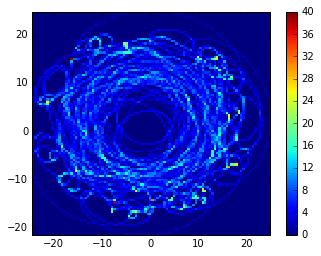

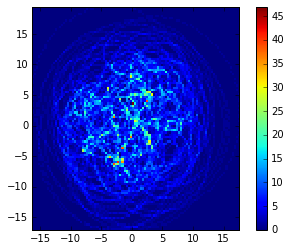

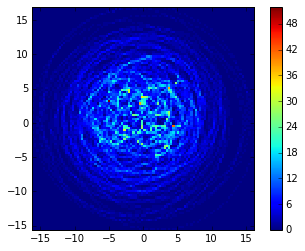

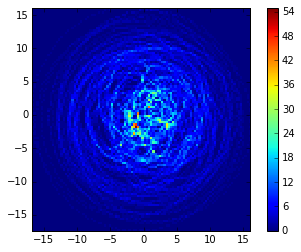

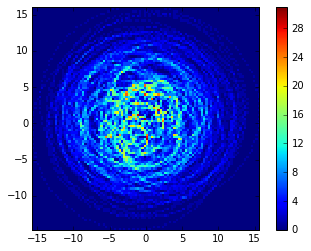

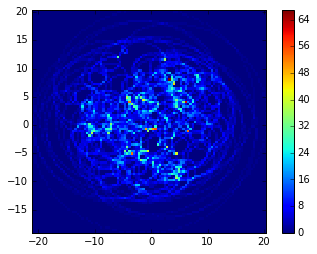

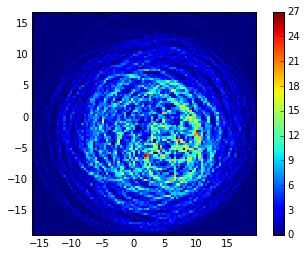

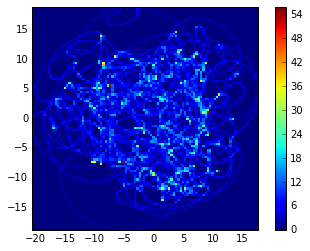

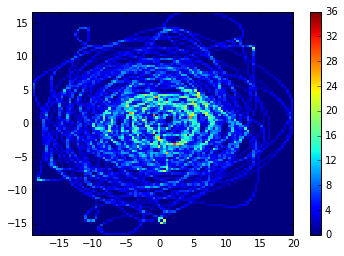

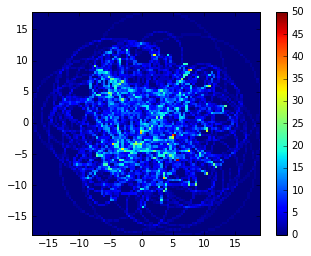

[0.25984889817648804, 0.28012916118923242, 0.30713791039114113, 0.17177636555166892, 0.11597448200960719, 0.18592249498629443, 0.35736670576327006, 0.20611783466627939, 0.18426203849867609]
[0.28548055759798596, 0.32964822285061374, 0.33229304421981171, 0.19808865375721724, 0.14316783354237658, 0.23113364975137302, 0.37826101006257801, 0.18921965588843853, 0.17816574622252679]
Error code:  


Checksum:  0


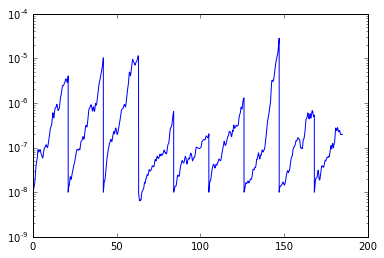

In [6]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 4.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(10,1), dimensionality=1,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)




/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  0.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


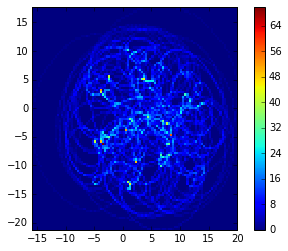

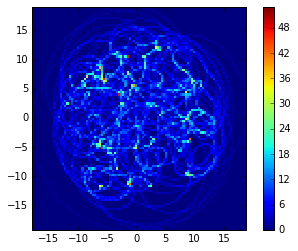

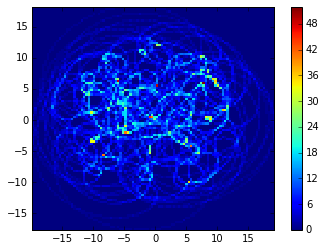

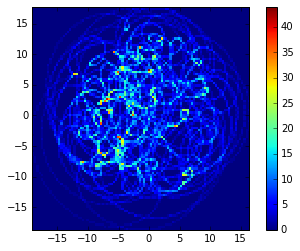

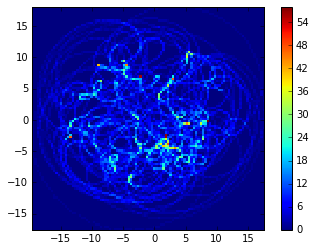

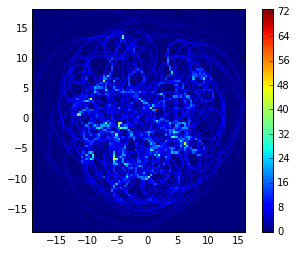

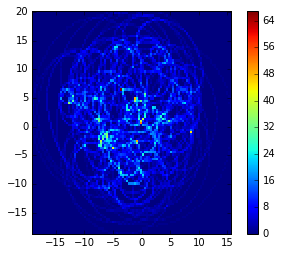

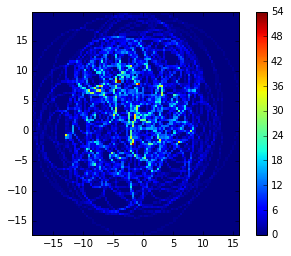

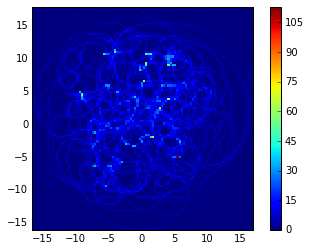

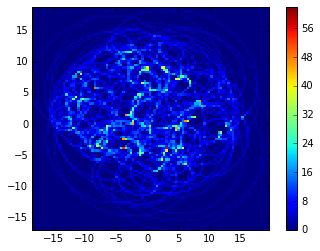

[0.2732325675805346, 0.38277156911124366, 0.35125933023585237, 0.44562113458945118, 0.28954544120428843, 0.30496019599210478, 0.39976359023090868, 0.33634475901046168, 0.32912045986763]
[0.30973136058803391, 0.35204043078647201, 0.36732277702726551, 0.44406349221198876, 0.30446072581757067, 0.30674859437814805, 0.41332395212979939, 0.33896938017550238, 0.33918513270360978]
Error code:  


Checksum:  0


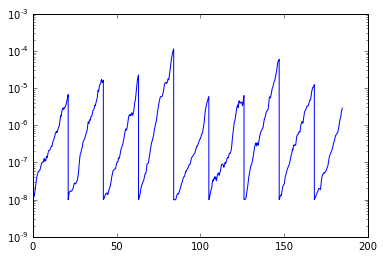

In [7]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 0.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(10,1), dimensionality=1,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)





/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  10.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


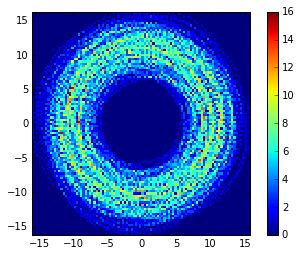

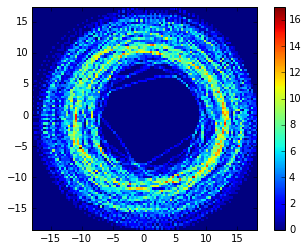

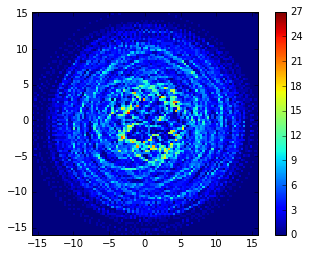

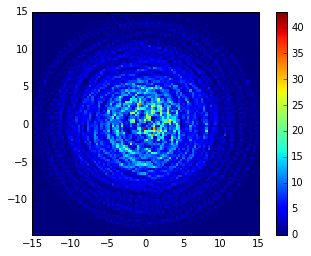

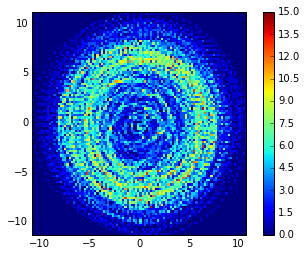

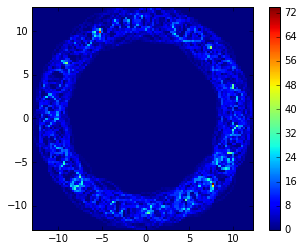

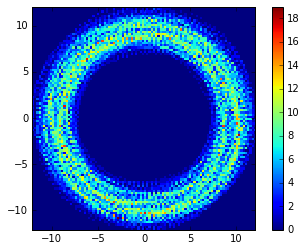

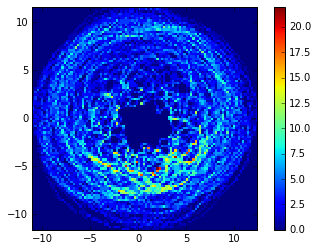

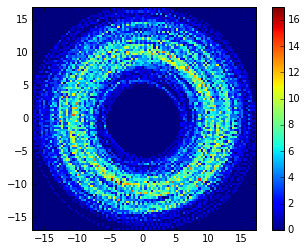

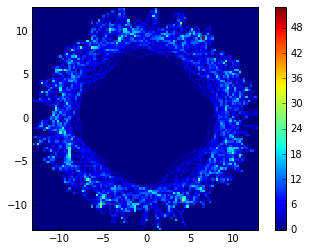

[0.12849689289362898, 0.038273231861532711, 0.021821855305860633, 0.046557172035819154, 0.06569092344856263, 0.074183659043641048, 0.056876893447060359, 0.048247580871203337, 0.060957291682943594]
[0.16993159473602698, 0.0238886698516283, 0.013041747384254053, 0.039618764058817854, 0.068504588948346407, 0.067334999430432335, 0.052993634591983967, 0.039079396654368152, 0.068579440208051207]
Error code:  


Checksum:  0


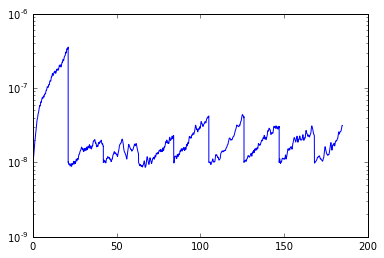

In [8]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 10.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(10,1), dimensionality=1,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)






/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  0.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


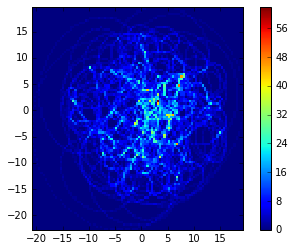

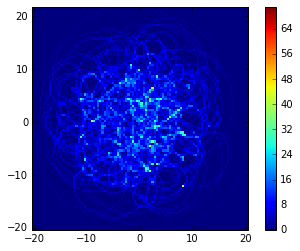

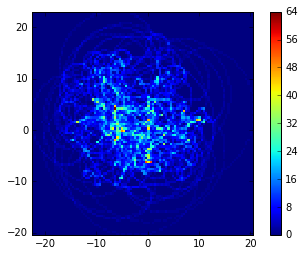

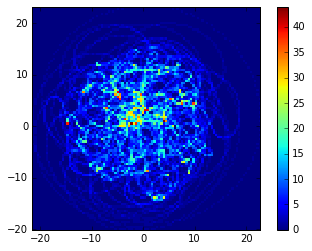

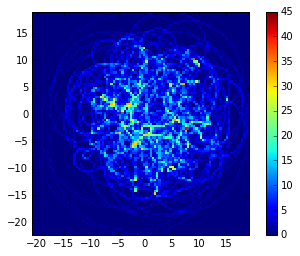

...

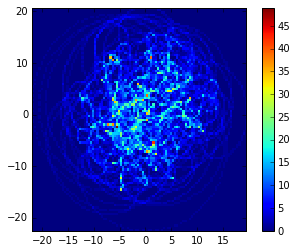

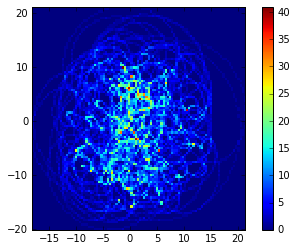

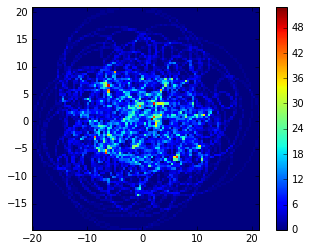

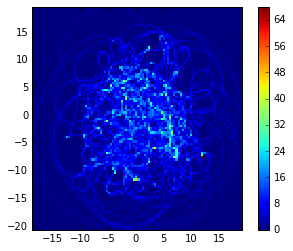

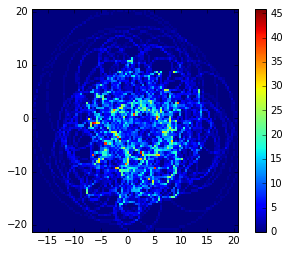

[0.45570623730101545, 0.52324448552559499, 0.49493971823620775, 0.48764134430130956, 0.46479022909155487, 0.45534636491231334, 0.49301054614130652, 0.53903492519968899, 0.46584063042334656]
[0.44564174601790985, 0.52143344083044318, 0.47881024777198761, 0.4755591827753281, 0.4634327931881026, 0.46712873222588275, 0.49043019406427946, 0.52652406579218947, 0.46711154097119606]
Error code:  


Checksum:  0


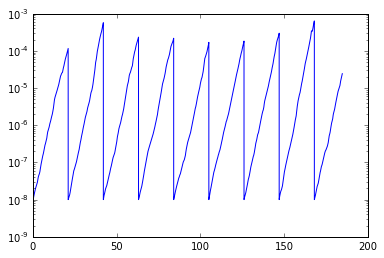

In [9]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 0.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(10,10), dimensionality=2,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)

/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  4.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


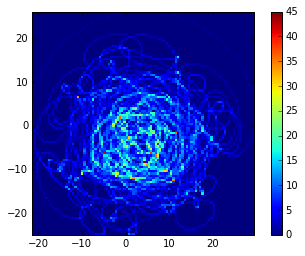

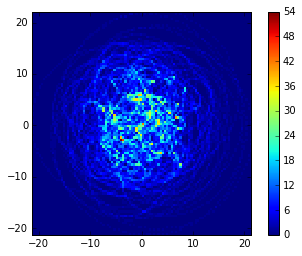

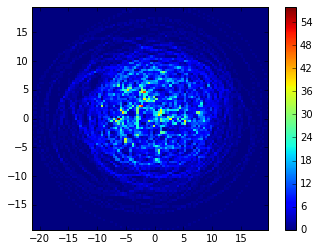

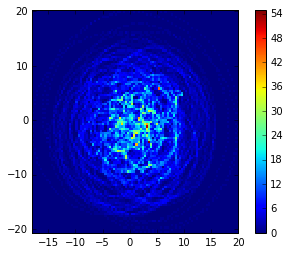

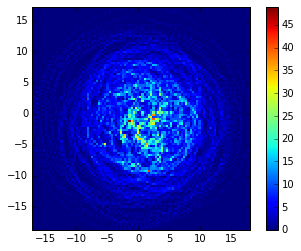

...

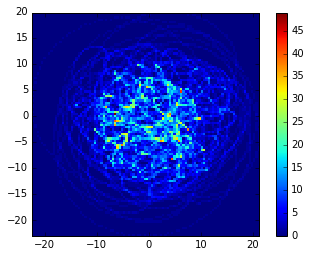

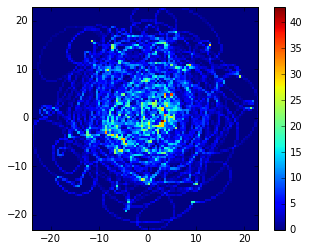

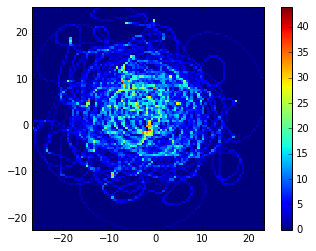

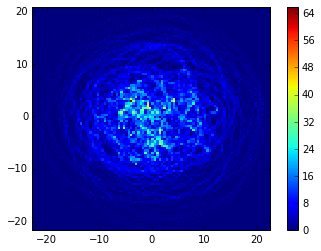

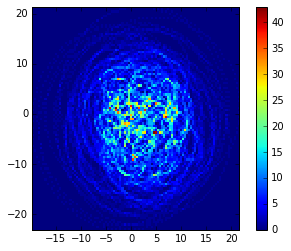

[0.62518890944587913, 0.61123922186266888, 0.49473203299185592, 0.5465686805481732, 0.44412654685198844, 0.46724425221105881, 0.56862943975936375, 0.56488336105877968, 0.65230764039688616]
[0.62490823654437033, 0.60353657233925884, 0.49798672390555659, 0.53184347739603688, 0.44177430001758683, 0.47581747611512731, 0.5464355913864225, 0.55950284920908566, 0.63484748044028094]
Error code:  


Checksum:  0


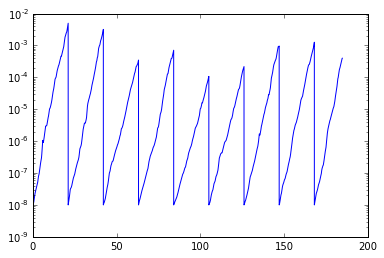

In [13]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 4.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(10,10), dimensionality=2,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)

/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  10.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


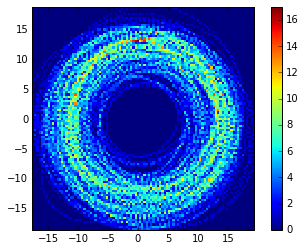

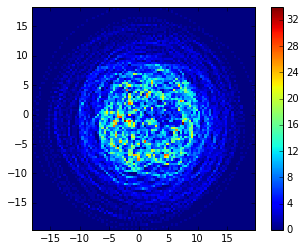

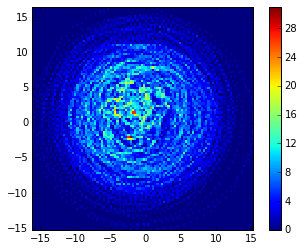

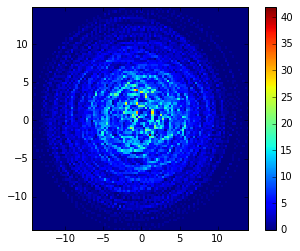

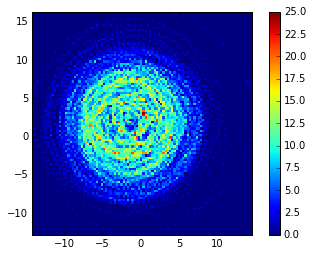

...

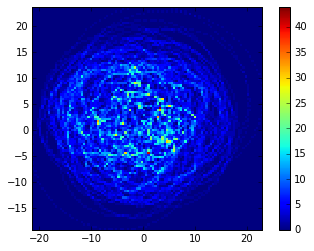

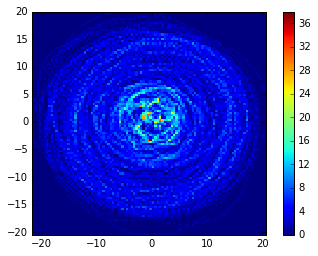

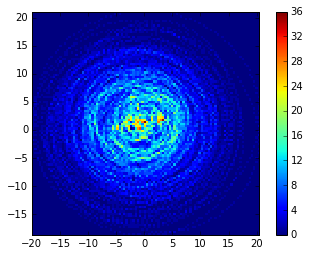

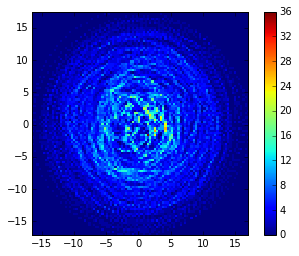

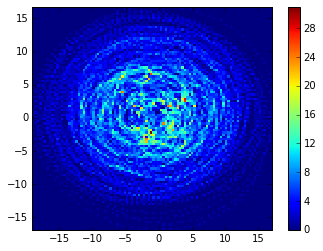

[0.48172315339256044, 0.56329856089737573, 0.65284812872115983, 0.56437570608977683, 0.72089707532537295, 0.66979276068015259, 0.50309854659461306, 0.58480062843975344, 0.6788542471114809]
[0.49835002087576974, 0.54542887534030116, 0.58218851625712842, 0.53963252418621155, 0.62008262418183213, 0.62732077308986689, 0.54417558259896703, 0.60179697481604988, 0.7164432833632326]
Error code:  


Checksum:  0


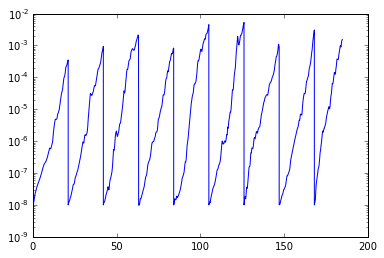

In [14]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 10.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(10,10), dimensionality=2,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)

/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  0.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


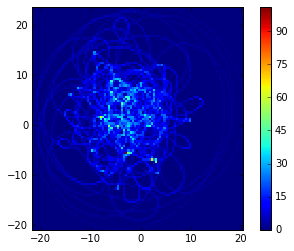

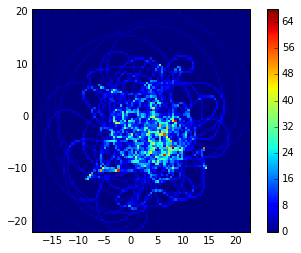

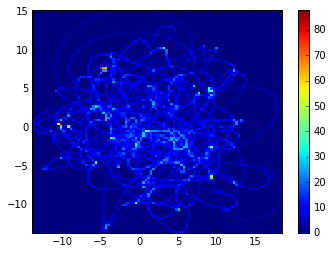

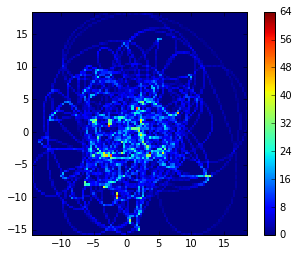

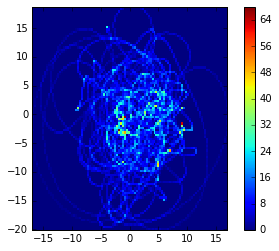

...

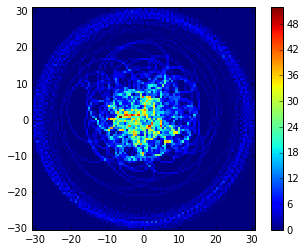

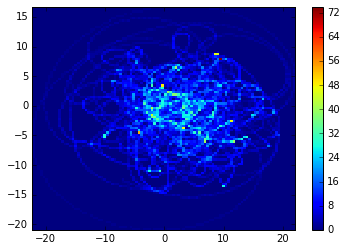

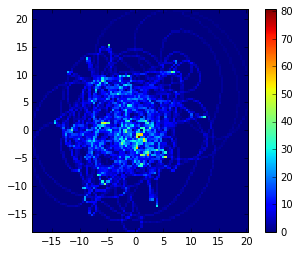

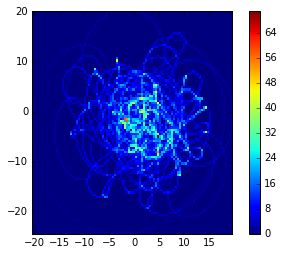

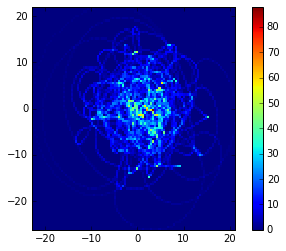

[0.88806095671915974, 0.59591854123691634, 0.78620290277497806, 0.63512958239204742, 0.5412928895407203, 0.52597101758541054, 0.70062033353970743, 0.71491356801173989, 0.55798498005651698]
[0.8297950326045922, 0.62227896366860258, 0.73346787868692165, 0.72257913268810403, 0.52694669719097387, 0.54955567896906088, 0.70275951149314397, 0.67073763136979248, 0.53916068023084496]
Error code:  


Checksum:  0


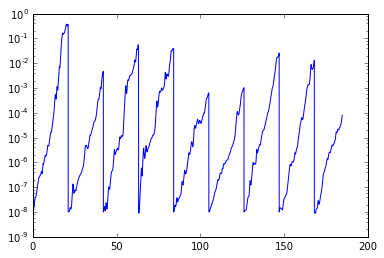

In [10]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 0.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(100,1), dimensionality=2,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)

/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  4.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


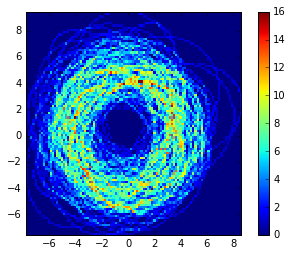

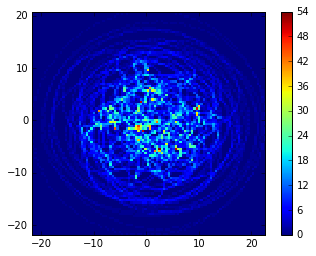

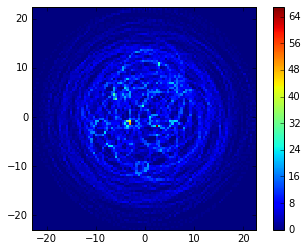

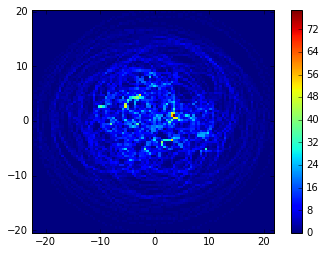

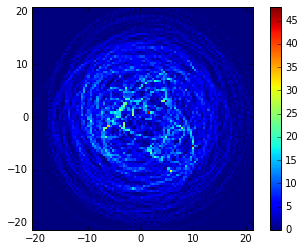

...

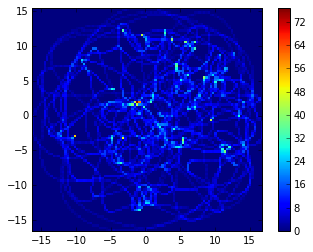

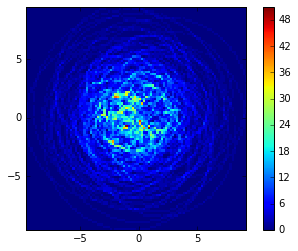

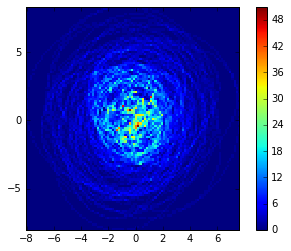

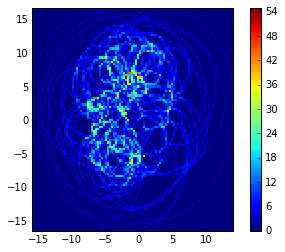

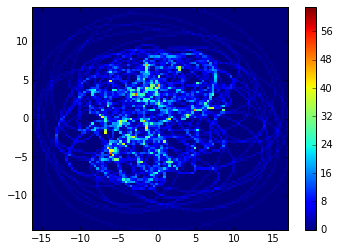

[0.46273822686995358, 0.41785246495911205, 0.30778445394269804, 0.84578835569476751, 0.5801679992565576, 0.27273373621240299, 0.34780904250532946, 0.60949185163366892, 0.41424447312922863]
[0.48355305521676678, 0.37709344502939773, 0.34657357650962656, 0.68721469735026453, 0.51767068313772269, 0.31602320666281075, 0.38434576065478826, 0.56842361470952663, 0.37532170756250993]
Error code:  


Checksum:  0


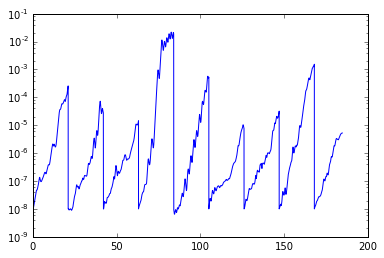

In [11]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 4.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(100,1), dimensionality=2,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)

/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  10.0
Characteristic, full, step times, n_steps
0.57735026919 184.752086141 0.007 26393
random


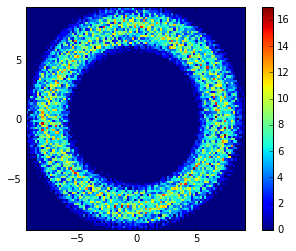

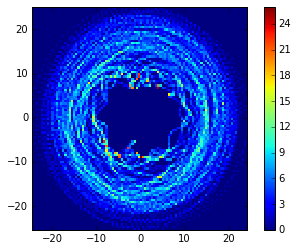

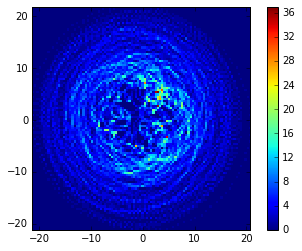

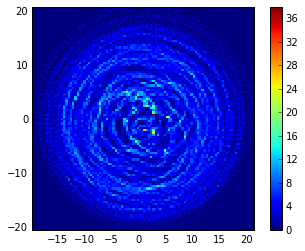

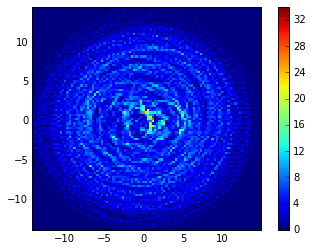

...

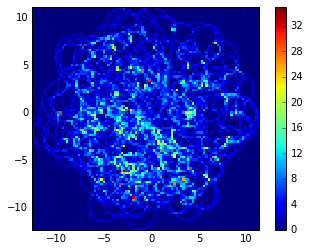

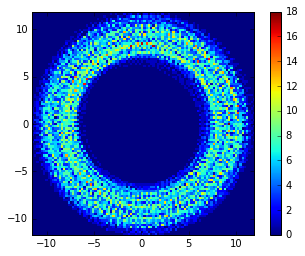

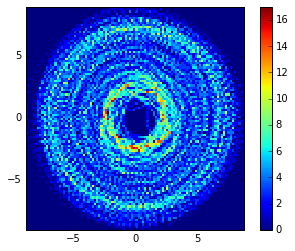

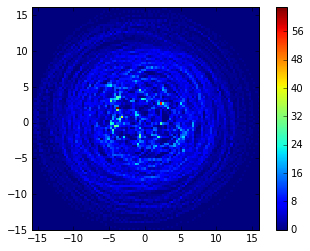

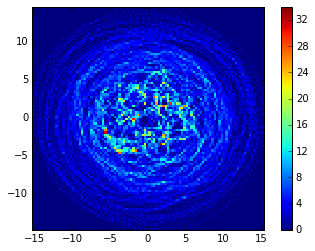

[0.22203208044813233, 0.24165493847393815, 0.20439457925886007, 0.26762969784169299, 0.14443727854580923, 0.26356671379094082, 0.47132943273540878, 0.098784778212422916, 0.19279407596567152]
[0.28864641382987311, 0.21262070017029333, 0.18054608270187553, 0.25825784323111095, 0.15431699617822994, 0.29548440663247189, 0.43190154701592121, 0.16787315688908136, 0.14767532139393832]
Error code:  


Checksum:  0


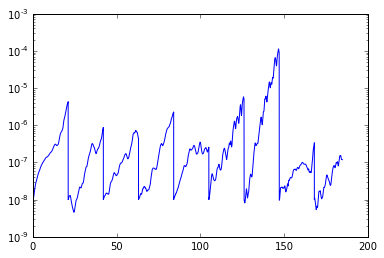

In [12]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 80.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 10.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(100,1), dimensionality=2,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)

/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  0.0
Characteristic, full, step times, n_steps
0.57735026919 1847.52086141 0.007 263931
random


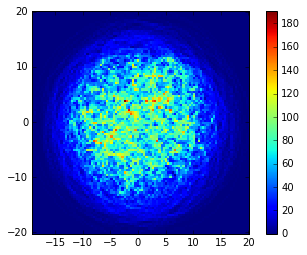

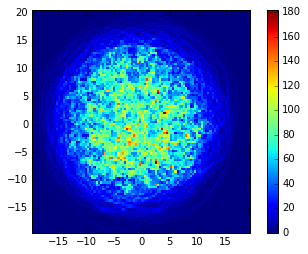

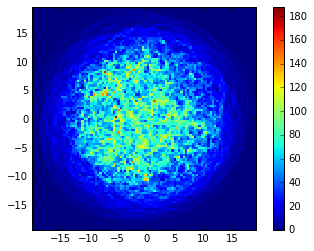

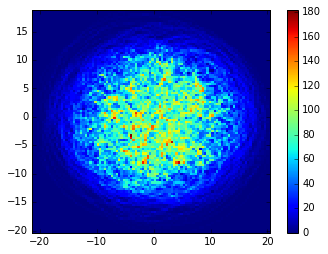

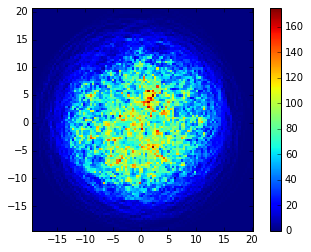

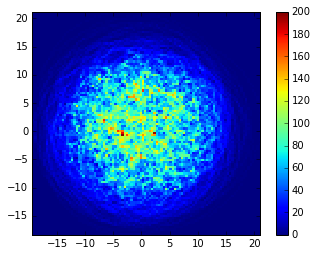

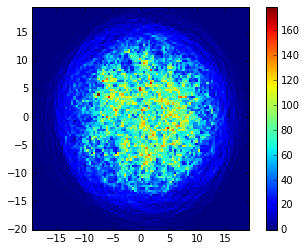

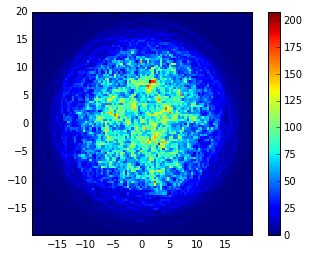

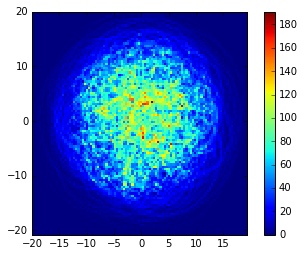

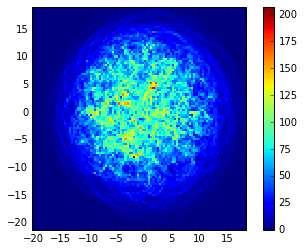

[0.26843553948824972, 0.3639422429526713, 0.34535800136361994, 0.31754322908025356, 0.40918516948484346, 0.31778192862581384, 0.3171057546681646, 0.35913982163546349, 0.32814426105743327, 0.34238516758491949, 0.31105098108348778, 0.37700320406190418, 0.34916241833183675, 0.32489456736202715, 0.3428829933285516, 0.28719055291477286, 0.35108392801589006, 0.26805229739909092, 0.2587985230464751, 0.35668372044094693, 0.30015805407001661, 0.31047601803191438, 0.39859976837285477, 0.40543844992817779, 0.30918536591241685, 0.32134571087927122, 0.33737471677688374, 0.38784190804324575, 0.34259996045437269, 0.36083664133022086, 0.28939424103708722, 0.4343623139874257, 0.32515356971293768, 0.28593161396898603, 0.56433808315572842, 0.40809849904631496, 0.33618486011070597, 0.42772629587093769, 0.22774880430384245, 0.37687119009284648, 0.27879444839834505, 0.31369627532034267, 0.38772334518599899, 0.32029914285257238, 0.33672726036199174, 0.3091909935619318, 0.35486022536631467, 0.3967534082444834

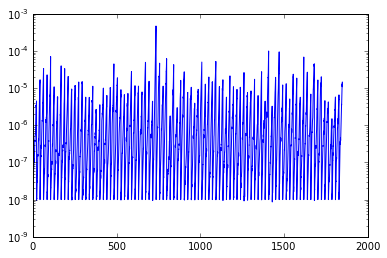

In [15]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 800.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 0.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(10,1), dimensionality=1,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)

/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  4.0
Characteristic, full, step times, n_steps
0.57735026919 1847.52086141 0.007 263931
random


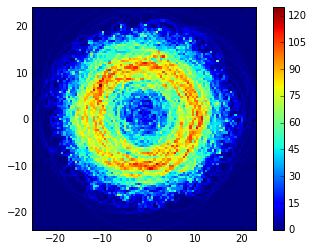

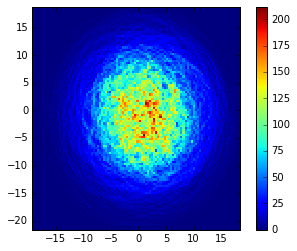

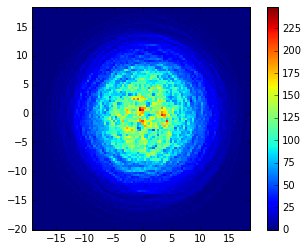

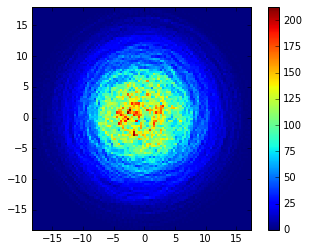

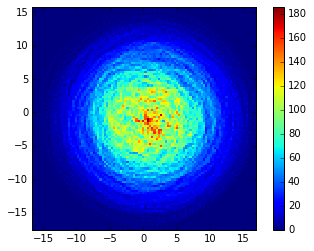

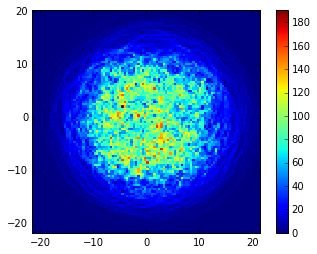

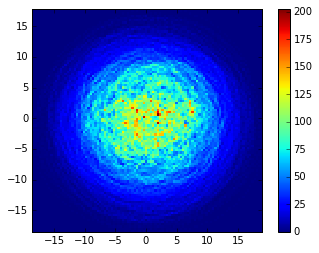

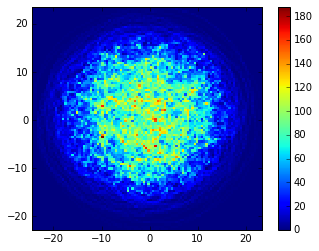

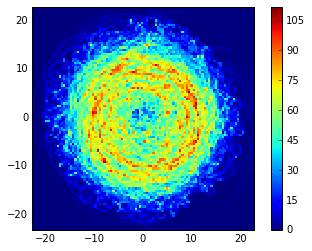

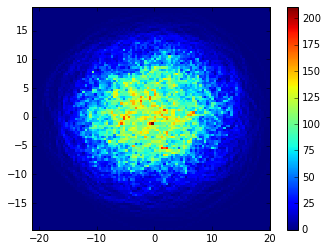

[0.37764584601267548, 0.48061999560550905, 0.37795702179962026, 0.26698434439558394, 0.41485649665946966, 0.33163101514526289, 0.26681182835135003, 0.31042215228559544, 0.33204538019294011, 0.16255775684960971, 0.36087525995754199, 0.31203230753836392, 0.26218771783223321, 0.22026088151813428, 0.30937000966210076, 0.21534032167294204, 0.16244084149324176, 0.35245952970377464, 0.26214056272361219, 0.30985244325351086, 0.21633164055327231, 0.33437242603232964, 0.26171253033706193, 0.3004743736740228, 0.37907540319566946, 0.20584881923913889, 0.31053979019266365, 0.32275823053053049, 0.21741368230705477, 0.25880869594945616, 0.38073020304482136, 0.26560132384770474, 0.35037798067627934, 0.13927754870724421, 0.2409002265405891, 0.21550186470245006, 0.33130783673202424, 0.21429879981566519, 0.36439257450323098, 0.25984850845597085, 0.27415676275698653, 0.36434573249077856, 0.30917439126867369, 0.29155395074989826, 0.25307108101999182, 0.36831279178003656, 0.27205165316757607, 0.238693791122

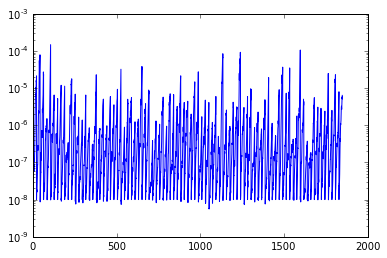

In [16]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 800.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 4.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(10,1), dimensionality=1,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)

/Users/tarkhov/anaconda/lib/python2.7/site-packages/matplotlib/mpl-data/matplotlibrc
3 ['/Users/tarkhov/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py', '-f', '/Users/tarkhov/Library/Jupyter/runtime/kernel-eb80f1a0-727a-4347-b6b5-5758cf0ecd02.json']
Noise  30.0
Characteristic, full, step times, n_steps
0.57735026919 1847.52086141 0.007 263931
random


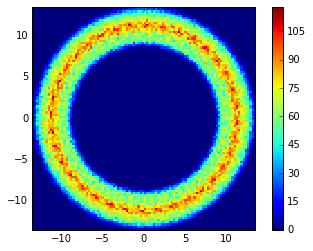

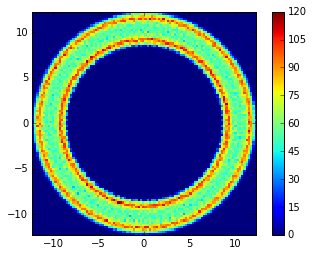

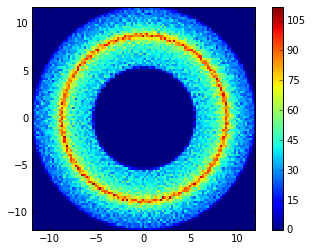

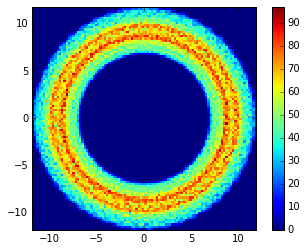

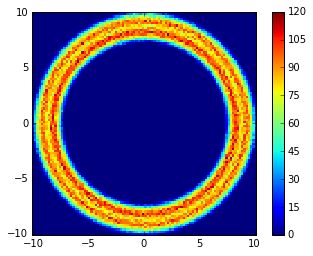

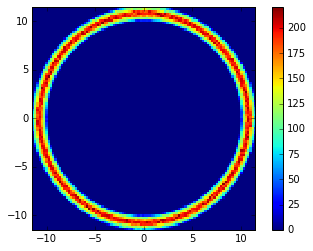

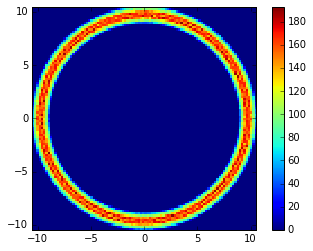

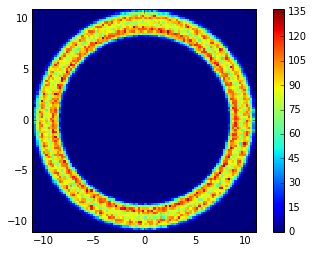

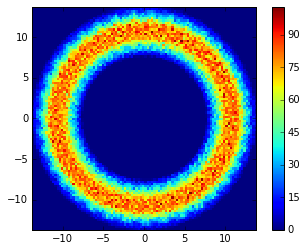

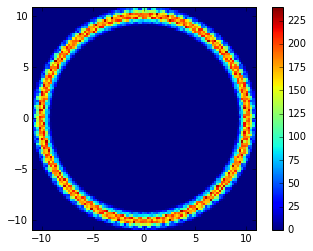

[0.12644367815862881, 0.030708602546060192, 0.018623388208151417, 0.015311224193263083, 0.010050533023851466, 0.0075333900364600989, 0.0058334439689537486, 0.0055073937859025455, 0.0081664364417314683, 0.0059819583516362374, 0.0078738205227096864, 0.005576921551464927, 0.0031848274266172752, 0.0060606811556800522, 0.0014185584367360413, 0.0019392699787539956, 0.0084189785276004639, 0.010187256519843433, 0.021481129689960726, 0.010657643715699988, 0.0028810558544544122, 0.014539728847526493, -0.0062172579089025907, 0.0069215370997734553, 0.024347357410748664, 0.0099074894886305512, 0.026795206584648141, 0.0089258516243454211, 0.021204192658545954, 0.022011310816314241, -0.0086138761207982945, 0.052163345440279965, 0.021329649475271356, 0.034627561793481441, 0.0573990250598354, 0.017073556568903223, 0.030949348484154624, 0.011801419681908686, 0.011125901599683873, 0.0126956820796921, 0.015760158901277993, 0.026823352761419686, 0.026194900558031392, 0.012948546096377658, 0.044441717299443

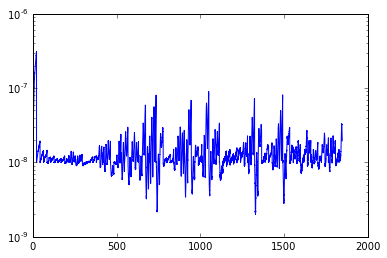

In [17]:
import numpy as np
from GPElib.LyapunovGenerator import LyapunovGenerator
from GPElib.visualisation import Visualisation
import matplotlib
print matplotlib.matplotlib_fname()
import matplotlib.pyplot as plt
import sys

sys.stderr = sys.stdout

def init_instability(inst, traj_seed):
    inst.generate_init('random', traj_seed, 10.)
    delta = (2. * np.sqrt(1.0 * inst.N_part/inst.N_wells)) * np.random.rand()
    x0, y0, err = inst.E_const_perturbation_XY(inst.X[:,:,0], inst.Y[:,:,0], delta)
    x1, y1 = inst.constant_perturbation_XY(x0,y0)
    inst.set_init_XY(x0,y0,x1,y1)
    return err

print len(sys.argv), sys.argv

if len(sys.argv) > 4:
    seed_from = int(sys.argv[1])
    seed_to = int(sys.argv[2])
    my_id = int(sys.argv[3])
    unique_id = sys.argv[4]
else:
    seed_from = 0
    seed_to = 1
    needed_trajs = np.arange(seed_from, seed_to)
    my_id = 0
    unique_id = 'ID_not_stated'

needed_trajs = np.arange(seed_from, seed_to)
perturb_seeds = np.arange(123,124)#(2381,2382)#(100, 110)#(106,108)#(97,98)#(97, 100)#(15, 18) #[53, 12, 20, 87]

time = 4 * 800.
# time = 1.
# time = 100. * 15
# step = 0.00015625
step = 0.007
N_wells = 10
W = 30.
lyap = LyapunovGenerator(N_part_per_well=100,
                     W=W, disorder_seed=78,
                     N_wells=(10,1), dimensionality=1,
                     reset_steps_duration=3000, FloatPrecision=np.float64,
                         time=time, step=step)

grname = 'GPE_lyap_' + unique_id
vis = Visualisation(is_local=1, GROUP_NAMES=grname)

print "Noise ", W
print "Characteristic, full, step times, n_steps"
print lyap.tau_char, lyap.time, lyap.step, lyap.n_steps

num_good = 0

lmbdas = []
lmbdas_no_regr = []
chosen_trajs = []
effective_nonlinearity = []
energies = []
numb_of_part = []

for i_traj, traj_seed in enumerate(needed_trajs):
    if num_good > needed_trajs.shape[0] - 1:
        print 'We really have enough trajs, exit!'
        break
    for j_traj, pert_seed in enumerate(perturb_seeds):
        if num_good > needed_trajs.shape[0] - 1:
            print 'We really have enough trajs, exit!'
            break
        np.random.seed(traj_seed)
        lyap.traj_seed = traj_seed
        lyap.pert_seed = pert_seed
        err = init_instability(lyap, traj_seed)
        if err == 1:
            print 'Bad trajectory! ', i_traj
        lyap.run_dynamics()
        lmbdas.append(lyap.lambdas)
        lmbdas_no_regr.append(lyap.lambdas_no_regr)
        chosen_trajs.append((traj_seed, pert_seed))
        effective_nonlinearity.append(lyap.effective_nonlinearity)
        energies.append(lyap.energy)
        numb_of_part.append(lyap.number_of_particles)
        for i in lyap.wells_indices:
            H, xedges, yedges = lyap.histograms[i]
            plt.imshow(H, interpolation='nearest', origin='low',
                extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]])
            plt.colorbar()
            plt.show()
#             plt.plot(lyap.histograms[i])
#             plt.show()
        print lyap.lambdas
        print lyap.lambdas_no_regr
        num_good += 1
        plt.semilogy(lyap.T, lyap.distance)
    plt.savefig(vis.HOMEDIR + 'pics/Lyap_' + unique_id + '_' + str(my_id)+'.png', format='png', dpi=100)

print "Error code: ", lyap.error_code
print "\n\nChecksum: ", lyap.consistency_checksum

np.savez(vis.filename(my_id),
     lambdas=lmbdas, lambdas_no_regr=lmbdas_no_regr,
     eff_nonl=effective_nonlinearity,
     numb_of_part=numb_of_part, energies=energies,
     chosen=chosen_trajs, step=lyap.step, time=lyap.time, n_steps=lyap.n_steps,
     my_info=[seed_from, seed_to, needed_trajs, my_id],
     checksum=lyap.consistency_checksum, error_code=lyap.error_code,
     distance=lyap.distance)